# Daniel Bain
# Udacity Deep Reinforcement Learning Course
# Project #2: Continuous Control using Deterministic Policy Gradients

---


This is the second project of the [Deep Reinforcement Learning Nanodegree](https://www.udacity.com/course/deep-reinforcement-learning-nanodegree--nd893) program.  In this notebook, I am applying a reinforcement learning algorithm known as a __deterministic policy gradient__ to learn to control a robot arm in the Unity ML-Agents environment.  

In order to make it easy to follow along, all relevant code for this project is contained in this Jupyter Notebook.  I'll do my best to explain the background of the project, the approach, and the code and hyperparameters utilized.


## 1.  Background

For this project, we have been asked to apply a self learning neural network to learn how to control a robot arm.  

In contrast to a discrete action set, such as controlling a joystick to play an Atari game, that may require choosing between a small number of possible actions, controlling a robot arm is considered a ___continuous control___ problem because controlling a physical joint requires specifying the position of the joint in real space and/or the non-discrete amount of force to be applied.  

As discussed below (in _Section B, Deterministic Policy Gradients_), training a neural network in continuous space benefits from a different approach compared to training a network that performs in a discrete space.

The following is a basic example of an actual double-jointed robot arm that was trained to operate with a neural network.  See: https://www.youtube.com/watch?v=ZVIxt2rt1_4



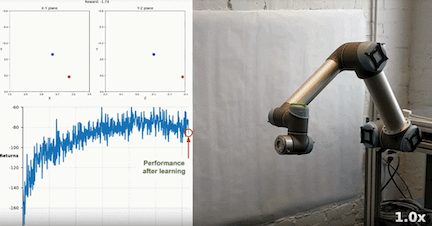


### A. Reacher Environment

By contrast to the real world example above, the robot arm being trained in this notebook is a "virtual" robot arm environment known as "Reacher" that has been built on the Unity engine.

The Reacher Environment is included in the sample environments provided by Unity in its ML-Agents toolkit.  

The generic Reacher environment's attributes are described at the Unity Github page (https://github.com/Unity-Technologies/ml-agents/blob/master/docs/Learning-Environment-Examples.md#reacher):

  - __Set-up__: Double-jointed arm which can move to target locations.
  - __Goal__: The agents must move it's hand to the goal location, and keep it there.
  - __Agents__: The environment contains 10 agent linked to a single Brain.
  - __Agent Reward Function (independent)__: 
    - +0.1 Each step agent's hand is in goal location.
  - __Brains__: One Brain with the following observation/action space.
    - __Vector Observation space__: 26 variables corresponding to position, rotation, velocity, and angular velocities of the two arm Rigidbodies.
    - __Vector Action space__: (Continuous) Size of 4, corresponding to torque applicable to two joints.
    - __Visual Observations__: None.
  - __Reset Parameters__: Two, corresponding to goal size, and goal movement speed.
  - __Benchmark Mean Reward__: 30

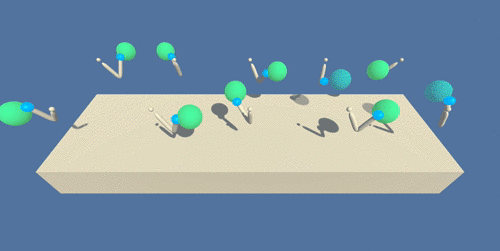

For this project, we had the option to work either with: 

  1. an environment wiht a **single** Reacher agent; or 
  
  2. a second version of the environment that includes **20 identical agents, each with its own copy of the environoment**.
  
For instructions on setting up your own Unity environment from scratch, see: https://github.com/Unity-Technologies/ml-agents/blob/master/docs/Getting-Started-with-Balance-Ball.md
    
The second version is conveniently set up to apply distributed learning algorithms like PPO, A3C, and D4PG (that use multiple, non-interacting, parallel copies of the same agent to distribute the task of gathering experience).  

For this project, I chose to use __the second version, thar has 20 identical agents__.  


### B. Deterministic Policy Gradients



__Deterministic policy gradients__ are a method of Actor to Critic (A2C) reinforcement learning that have been shown to significantly outperform stochastic A2C methods in larger action spaces.  _see_: Silver et al., Deterministic Policy Gradient Algorithms (2014), http://proceedings.mlr.press/v32/silver14.pdf.

Whereas, e.g. using standard A2C learning, ___stochastic policy gradient___ methods return a probability distribution that we sample from to determine the best course of action in a state, ___deterministic policy gradient___ methods directly provide a ___specific best action to take from every state___.

In theorems presented in the paper referenced above, the authors first show that a stochastic policy gradient is essentially ___equivalent___ to a deterministic policy gradient.  Then they show that deterministic gradients are compatible with function approximators, such as neural networks.

The authors explain several important features of deterministic policy gradients that, they assert, make them more effective at learning for higher dimensional problems than stochastic policy gradients.  First, stochastic gradients become extremely complex to calculate because stochastic gradients change more rapidly near the mean and their variance grows to infinity as the policy becomes deterministic.  In larger action spaces the calculations are even more complex.  

Moreover, ___a determinstic policy allows for off-policy learning___ (as with off-policy DQN methods, exploration is achieved via random actions taken during training).  Also, a deterministic policy works with the chain rule to determine Q-values--and thereby allows us to maximize Q-values and better optimize learning while simultaneously finding the best policy.


#### 1. DDPG

In 2016, Google Deep Mind published a follow-up paper that introduced a _deep_ deterministic policy gradient method they called __DDPG__ ("Deep Deterministic Policy Gradient"). _see_: Lillicrap et al., Continuous Control with Deep Reinforcement Learning (2016), https://arxiv.org/pdf/1509.02971.pdf.  

DDPG uses 2 deep neural networks (akin to an actor-critic network) to demonstrate the efficacy of deterministic policy gradients at solving continuous control problems.  

The pseudocode for the DDPG algorithm from the Google Deep Mind paper is referenced below:

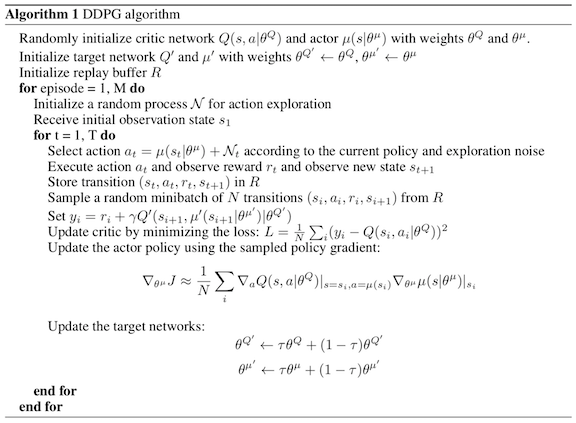

In the DDPG paper, the authors demonstrated that this single algorithm is "___model free___" by successfully training it to solve 20 different simulated physics tasks.


#### 2. D4PG

Earlier this year, in April 2018, Google Deep Mind published details about an updated algorithm that they called __D4PG__ ("Distributed Distributional Deterministic Policy Gradients").  _see_: Barth-Maron et al., Distributed Distributional Deterministic Policy Gradients (2018), https://arxiv.org/pdf/1804.08617.pdf.

D4PG provides several useful improvements to application of deterministic policy gradients for continuous control problems.  First, it applies a __distributional__ version of the critic update as well as distributed parallel actors __which together result in better, more stable gradients and improved learning performance__.  In addition, D4PG applies some of the "rainbow" of improvements made to the DQN value network such as N -step returns and prioritization of the experience replay.  I discussed and applied some of these improvements in the first project of this course.  (_see_: https://github.com/danielbain/Deep-Reinforcement-Learning/tree/master/Udacity_P1_Navigation)

The pseudocode for the D4PG algorithm from the Google Deep Mind paper is referenced below:

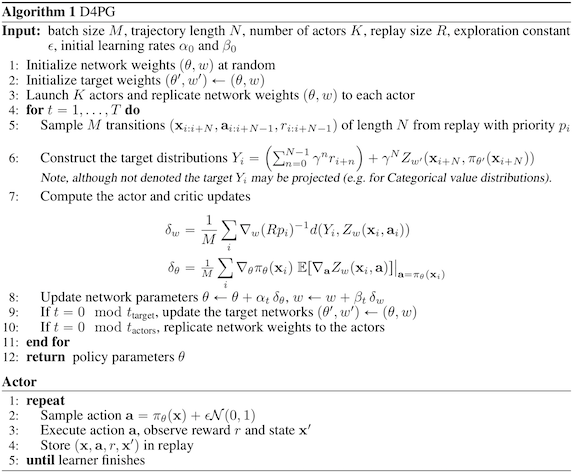




## 2. Load Packages & Set Up Environment

First step is to import the necessary packages.  Here I am importing the Unity Environment as well as numpy, Pytorch, etc.

In [1]:
from unityagents import UnityEnvironment

import numpy as np

import random

import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.nn as nn

import copy

from collections import namedtuple, deque

import datetime

import matplotlib.pyplot as plt
%matplotlib inline



Next, we will start the Unity environment.  The `file_name` parameter needs to be changed to match the location of the Unity environment.  I have included the Mac OS X environment in this Github repo so to get this to run on a local machine it will be necessary to change the file path to work on your own local machine (or load the relevant environment for your machine).

- **Mac**: `"path/to/Reacher.app"`
- **Windows** (x86): `"path/to/Reacher_Windows_x86/Reacher.exe"`
- **Windows** (x86_64): `"path/to/Reacher_Windows_x86_64/Reacher.exe"`
- **Linux** (x86): `"path/to/Reacher_Linux/Reacher.x86"`
- **Linux** (x86_64): `"path/to/Reacher_Linux/Reacher.x86_64"`
- **Linux** (x86, headless): `"path/to/Reacher_Linux_NoVis/Reacher.x86"`
- **Linux** (x86_64, headless): `"path/to/Reacher_Linux_NoVis/Reacher.x86_64"`

For instance, if you are using a Mac, then you downloaded `Reacher.app`.  If this file is in the same folder as the notebook, then the line below should appear as follows:
```
env = UnityEnvironment(file_name="Reacher.app")
```
Local file names on my computer:
- single agent file name = "Reacher_mac_20_agent.app"
- 20 agent file name = "Reacher_mac_1_agent.app"

Environments contain brains which are responsible for deciding the actions of their associated agents. Here we check for the first brain available, and set it as the default brain we will be controlling from Python.

In [2]:
# Start the environment
env = UnityEnvironment(file_name='Reacher_mac_20_agent.app')

# get the default brain
brain_name = env.brain_names[0]
brain = env.brains[brain_name]

# reset the environment for training
env_info = env.reset(train_mode=True)[brain_name]

INFO:unityagents:
'Academy' started successfully!
Unity Academy name: Academy
        Number of Brains: 1
        Number of External Brains : 1
        Lesson number : 0
        Reset Parameters :
		goal_speed -> 1.0
		goal_size -> 5.0
Unity brain name: ReacherBrain
        Number of Visual Observations (per agent): 0
        Vector Observation space type: continuous
        Vector Observation space size (per agent): 33
        Number of stacked Vector Observation: 1
        Vector Action space type: continuous
        Vector Action space size (per agent): 4
        Vector Action descriptions: , , , 


In this environment, a double-jointed arm can move to target locations. A reward of `+0.1` is provided for each step that the agent's hand is in the goal location. Thus, the goal of the agent is to maintain its position at the target location for as many time steps as possible.

The observation space consists of `33` variables corresponding to position, rotation, velocity, and angular velocities of the arm.  Each action is a vector with four numbers, corresponding to torque applicable to two joints.  Every entry in the action vector must be a number between `-1` and `1`.

In [3]:
# determine number of agents, number of actions & size of state
num_agents = len(env_info.agents)
action_size = brain.vector_action_space_size
states = env_info.vector_observations
state_size = states.shape[1]

print('Number of agents:', num_agents)
print('Size of each action:', action_size)
print('There are {} agents. Each observes a state with length: {}'.format(states.shape[0], state_size))
print('The state for the first agent looks like:', states[0])



Number of agents: 20
Size of each action: 4
There are 20 agents. Each observes a state with length: 33
The state for the first agent looks like: [ 0.00000000e+00 -4.00000000e+00  0.00000000e+00  1.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -4.37113883e-08  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.00000000e+01  0.00000000e+00
  1.00000000e+00 -0.00000000e+00 -0.00000000e+00 -4.37113883e-08
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  5.75471878e+00 -1.00000000e+00
  5.55726624e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00
 -1.68164849e-01]




## 3. Implement DDPG

### A. Set up Actor and Critic Neural Network Models

Next step, I will set up the actor and critic neural networks.

I have structured the actor and critic networks the same way that is described in the Google Deep Mind DDPG paper referenced above.  In Section 7, Supplementary Information, the authors described the generalized network that they used:

>We used Adam (Kingma & Ba, 2014) for learning the neural network parameters with a learning rate of 10−4 and 10−3 for the actor and critic respectively. For Q we included L2 weight decay of 10−2 and used a discount factor of γ = 0.99. For the soft target updates we used τ = 0.001. The neural networks used the rectified non-linearity (Glorot et al., 2011) for all hidden layers. The final output layer of the actor was a tanh layer, to bound the actions. The low-dimensional networks had 2 hidden layers with 400 and 300 units respectively (≈ 130,000 parameters). Actions were not included until the 2nd hidden layer of Q. When learning from pixels we used 3 convolutional layers (no pooling) with 32 filters at each layer. This was followed by two fully connected layers with 200 units (≈ 430,000 parameters).  The final layer weights and biases of both the actor and critic were initialized from a uniform distribution [−3 × 10−3, 3 × 10−3] and [3 × 10−4, 3 × 10−4] for the low dimensional and pixel cases respectively. This was to ensure the initial outputs for the policy and value estimates were near zero.  

The actor is a simple feed forward neural network with two hidden layers.  The input is the state observation vector while the output is a vector with values for each possible action.  The last layer is a tanh activation function which gives an output between -1 and 1.

See below a quick sketch of the actor and critic network structures:

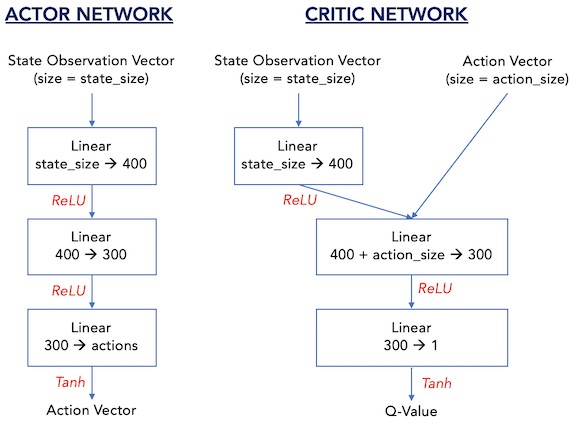

The actor network takes the vector of the observation state as an input and outputs a vector of actions.  The critic network takes the vector of the observation state as input and, after the first ReLU activation layer, takes the vector of actions from the actor network as an input.  The output for the critic network is a single Q value.


In [4]:
def hidden_init(layer):
    fan_in = layer.weight.data.size()[0]
    lim = 1. / np.sqrt(fan_in)
    return (-lim, lim)

class Actor(nn.Module):
    """Actor (Policy) Model."""

    def __init__(self, state_size, action_size, seed, fc1_units=400, fc2_units=300):
        """Initialize parameters and build model.
        Params
        ======
            state_size (int): Dimension of each state
            action_size (int): Dimension of each action
            seed (int): Random seed
            fc1_units (int): Number of nodes in first hidden layer
            fc2_units (int): Number of nodes in second hidden layer
        """
        super(Actor, self).__init__()
        self.seed = torch.manual_seed(seed)
        self.fc1 = nn.Linear(state_size, fc1_units)
        self.fc2 = nn.Linear(fc1_units, fc2_units)
        self.fc3 = nn.Linear(fc2_units, action_size)
        self.reset_parameters()

    def reset_parameters(self):
        self.fc1.weight.data.uniform_(*hidden_init(self.fc1))
        self.fc2.weight.data.uniform_(*hidden_init(self.fc2))
        self.fc3.weight.data.uniform_(-3e-3, 3e-3)    # Deep Mind set to -3e-4 for pixels

    def forward(self, state):
        """Build an actor (policy) network that maps states -> actions."""
        x = F.relu(self.fc1(state))
        x = F.relu(self.fc2(x))
        return torch.tanh(self.fc3(x))


class Critic(nn.Module):
    """Critic (Value) Model."""

    def __init__(self, state_size, action_size, seed, fcs1_units=400, fc2_units=300):
        """Initialize parameters and build model.
        Params
        ======
            state_size (int): Dimension of each state
            action_size (int): Dimension of each action
            seed (int): Random seed
            fcs1_units (int): Number of nodes in the first hidden layer
            fc2_units (int): Number of nodes in the second hidden layer
        """
        super(Critic, self).__init__()
        self.seed = torch.manual_seed(seed)
        self.fcs1 = nn.Linear(state_size, fcs1_units)
        self.fc2 = nn.Linear(fcs1_units+action_size, fc2_units)
        self.fc3 = nn.Linear(fc2_units, 1)
        self.reset_parameters()

    def reset_parameters(self):
        self.fcs1.weight.data.uniform_(*hidden_init(self.fcs1))
        self.fc2.weight.data.uniform_(*hidden_init(self.fc2))
        self.fc3.weight.data.uniform_(-3e-3, 3e-3)    # Deep Mind set to -3e-4 for pixels

    def forward(self, state, action):
        """Build a critic (value) network that maps (state, action) pairs -> Q-values."""
        xs = F.relu(self.fcs1(state))
        x = torch.cat((xs, action), dim=1)
        x = F.relu(self.fc2(x))
        return self.fc3(x)



### B. Set up and Instantiate the DDPG Learning Agent

Next step is to set up the Agent to translate state observations into actions and to interact and learn from the environment using the actor and critic networks defined above.  The Agent class defined below is modified from code provided in the Udacity course from previous examples of agents from bipedal and pendulum assignments.

Because I am using the version of the Reacher environment that is feeding in 20 simultaneous agents, I added an input for the number of agents (num_agents) into the function and made relevant modifications to the agent:  (i) added a loop to step through each of the agents when stepping forward through the function; and (ii) modified the noise generation function to match the size of the state tuple.  (I chose the 20 agent model because I had hoped to have enough time to demonstrate another netowrk and agent to implement D4PG using the same environment, but ran out of time.)

In order to ensure exploration, noise is added to agent actions using Ornstein-Uhlenbeck (OU) Process (OU Process applies stochastic noise based on the physics of Brownian motion of a particle).  After adding noise, actions are clipped to ensure that they fall within the range -1 to +1.



In [5]:
class Agent():
    """Interacts with and learns from the environment."""
    
    def __init__(self, state_size, action_size, num_agents, random_seed):
        """Initialize an Agent object.
        
        Params
        ======
            state_size (int): dimension of each state
            action_size (int): dimension of each action
            num_agents (int): number of agents
            random_seed (int): random seed
        """
        self.state_size = state_size
        self.action_size = action_size
        self.num_agents = num_agents
        self.seed = random.seed(random_seed)

        # Actor Network (w/ Target Network)
        self.actor_local = Actor(state_size, action_size, random_seed).to(device)
        self.actor_target = Actor(state_size, action_size, random_seed).to(device)
        self.actor_optimizer = optim.Adam(self.actor_local.parameters(), lr=LR_ACTOR)

        # Critic Network (w/ Target Network)
        self.critic_local = Critic(state_size, action_size, random_seed).to(device)
        self.critic_target = Critic(state_size, action_size, random_seed).to(device)
        self.critic_optimizer = optim.Adam(self.critic_local.parameters(), lr=LR_CRITIC, weight_decay=WEIGHT_DECAY)

        # Noise process
        self.noise = OUNoise((num_agents, action_size), random_seed)

        # Replay memory
        self.memory = ReplayBuffer(action_size, BUFFER_SIZE, BATCH_SIZE, random_seed)
    
    def step(self, state, action, reward, next_state, done):
        """Save experience in replay memory, and use random sample from buffer to learn."""
        # Save experience / reward -- looping through each agent
        for i in range(self.num_agents):
            self.memory.add(state[i,:], action[i,:], reward[i], next_state[i,:], done[i])

        # Learn, if enough samples are available in memory
        if len(self.memory) > BATCH_SIZE:
            experiences = self.memory.sample()
            self.learn(experiences, GAMMA)      
            
    def act(self, states, add_noise=True):
        """Returns actions for given state as per current policy."""
        states = torch.from_numpy(states).float().to(device)
        actions = np.zeros((self.num_agents, self.action_size))
        self.actor_local.eval()
        with torch.no_grad():
            for agent_num, state in enumerate(states):
                action = self.actor_local(state).cpu().data.numpy()
                actions[agent_num, :] = action
        self.actor_local.train()
        if add_noise:
            actions += self.noise.sample()
        return np.clip(actions, -1, 1)

    def reset(self):
        self.noise.reset()

    def learn(self, experiences, gamma):
        """Update policy and value parameters using given batch of experience tuples.
        Q_targets = r + γ * critic_target(next_state, actor_target(next_state))
        where:
            actor_target(state) -> action
            critic_target(state, action) -> Q-value

        Params
        ======
            experiences (Tuple[torch.Tensor]): tuple of (s, a, r, s', done) tuples 
            gamma (float): discount factor
        """
        states, actions, rewards, next_states, dones = experiences

        # ---------------------------- update critic ---------------------------- #
        # Get predicted next-state actions and Q values from target models
        actions_next = self.actor_target(next_states)
        Q_targets_next = self.critic_target(next_states, actions_next)
        # Compute Q targets for current states (y_i)
        Q_targets = rewards + (gamma * Q_targets_next * (1 - dones))
        # Compute critic loss
        Q_expected = self.critic_local(states, actions)
        critic_loss = F.mse_loss(Q_expected, Q_targets)
        # Minimize the loss
        self.critic_optimizer.zero_grad()
        critic_loss.backward()
        self.critic_optimizer.step()

        # ---------------------------- update actor ---------------------------- #
        # Compute actor loss
        actions_pred = self.actor_local(states)
        actor_loss = -self.critic_local(states, actions_pred).mean()
        # Minimize the loss
        self.actor_optimizer.zero_grad()
        actor_loss.backward()
        self.actor_optimizer.step()

        # ----------------------- update target networks ----------------------- #
        self.soft_update(self.critic_local, self.critic_target, TAU)
        self.soft_update(self.actor_local, self.actor_target, TAU)                     

    def soft_update(self, local_model, target_model, tau):
        """Soft update model parameters.
        θ_target = τ*θ_local + (1 - τ)*θ_target

        Params
        ======
            local_model: PyTorch model (weights will be copied from)
            target_model: PyTorch model (weights will be copied to)
            tau (float): interpolation parameter 
        """
        for target_param, local_param in zip(target_model.parameters(), local_model.parameters()):
            target_param.data.copy_(tau*local_param.data + (1.0-tau)*target_param.data)

class OUNoise:
    """Ornstein-Uhlenbeck process."""

    def __init__(self, size, seed, mu=0., theta=0.15, sigma=0.2):
        """Initialize parameters and noise process."""
        self.mu = mu * np.ones(size)
        self.theta = theta
        self.sigma = sigma
        self.seed = random.seed(seed)
        self.size = size
        self.reset()

    def reset(self):
        """Reset the internal state (= noise) to mean (mu)."""
        self.state = copy.copy(self.mu)

    def sample(self):
        """Update internal state and return it as a noise sample."""
        x = self.state
        dx = self.theta * (self.mu - x) + self.sigma * np.random.standard_normal(self.size)
        self.state = x + dx
        return self.state

class ReplayBuffer:
    """Fixed-size buffer to store experience tuples."""

    def __init__(self, action_size, buffer_size, batch_size, seed):
        """Initialize a ReplayBuffer object.
        Params
        ======
            buffer_size (int): maximum size of buffer
            batch_size (int): size of each training batch
        """
        self.action_size = action_size
        self.memory = deque(maxlen=buffer_size)  # internal memory (deque)
        self.batch_size = batch_size
        self.experience = namedtuple("Experience", field_names=["state", "action", "reward", "next_state", "done"])
        self.seed = random.seed(seed)
    
    def add(self, state, action, reward, next_state, done):
        """Add a new experience to memory."""
        e = self.experience(state, action, reward, next_state, done)
        self.memory.append(e)
    
    def sample(self):
        """Randomly sample a batch of experiences from memory."""
        experiences = random.sample(self.memory, k=self.batch_size)

        states = torch.from_numpy(np.vstack([e.state for e in experiences if e is not None])).float().to(device)
        actions = torch.from_numpy(np.vstack([e.action for e in experiences if e is not None])).float().to(device)
        rewards = torch.from_numpy(np.vstack([e.reward for e in experiences if e is not None])).float().to(device)
        next_states = torch.from_numpy(np.vstack([e.next_state for e in experiences if e is not None])).float().to(device)
        dones = torch.from_numpy(np.vstack([e.done for e in experiences if e is not None]).astype(np.uint8)).float().to(device)

        return (states, actions, rewards, next_states, dones)

    def __len__(self):
        """Return the current size of internal memory."""
        return len(self.memory)

### C. Set the hyperparameters

My network only needs to solve a single task (Reacher environment) and is not generalized to solve multiple tasks--so I used a little trial and error to adjust the hyperparameters to speed up learning for this robot arm assignment.  

In the code, I reference hyperparameters used in the 2015 Deep Mind DDPG paper and used these as a starting point.  Weight decay, which is used as a normalizer doesn't seem to improve learning and significantly slows down convergence--so I've lowered it from .01 used in the Deep Mind Paper to 0.00001.  Have also decreased the learning rate of the critic from 0.001 to 0.0003.

I am running this code on my MacBook Pro on its CPU.

In [6]:

BUFFER_SIZE = int(1e5)  # replay buffer size  (Deep Mind 2015 paper was 10^6)
BATCH_SIZE = 128         # minibatch size (Deep Mind 2015 paper was 64)
GAMMA = 0.99            # discount factor  (Deep Mind 2015 paper was 0.99)
TAU = 1e-3              # for soft update of target parameters
LR_ACTOR = 1e-4         # learning rate of the actor  (Deep Mind 2015 paper was 10^-4)
LR_CRITIC = 3e-4        # learning rate of the critic  (Deep Mind 2015 paper was 10^-3)
WEIGHT_DECAY = 1e-5     # L2 weight decay (Deep Mind 2015 paper was 10^-2)

# use GPU if available, otherwise, use CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


### D. Train Agent with DDPG

The DDPG function is used to loop through observation, training, and learning steps while tracking output and saving progress.

I initially had the maximum number of time steps per episode (max_t) set too low (based on the sample code provided in the course)--which wasn't allowing enough steps for learning.  Thanks to another student's suggestion on a course message board, I increased max_t significantly and saw improved performance. I have noticed some better approaches that don't rely on max_t--but as my model is working, for now I will not tinker with it further.

In [7]:
def ddpg(n_episodes=200, max_t=2000):
    """
    Params
    ======
        n_episodes (int): maximum number of training episodes
        max_t (int): maximum number of timesteps per episode

    """
    # Track the last 100 scores
    scores_deque = deque(maxlen=100)
    # scores_combine is a list containing scores from each episode
    scores_combine = []
    
    for i_episode in range(1, n_episodes+1):
        # Reset environment for training
        env_info = env.reset(train_mode=True)[brain_name]
        states = env_info.vector_observations
        agent.reset()
        scores = np.zeros(num_agents)
        
        for t in range(max_t):
            
            # Select and perform an action for each agent
            actions = agent.act(states)

            # Send actions to the environment
            env_info = env.step(actions)[brain_name] 
            
            # get the next state for each agent
            next_states = env_info.vector_observations
            
            # get the rewards for each agent
            rewards = env_info.rewards
            
            # see if episode has finished
            dones = env_info.local_done
            
            # update the score; roll over the state to next time step; exit loop if episode finished
            agent.step(states, actions, rewards, next_states, dones)
            states = next_states
            scores += rewards
            
            if np.any(dones):
                break 
        
        # append new scores to list of last 100 episodes as well as to list of all episodes
        scores_deque.append(np.mean(scores))
        scores_combine.append(np.mean(scores))
        
        # output progress and save model
        print('\rEpisode {}\tAverage Score: {:.2f}\tScore: {:.2f}\t{}'.format(
            i_episode, np.mean(scores_deque), np.mean(scores), datetime.datetime.now()))

        if np.mean(scores_deque)>=30.0:
            print('\nEnvironment solved in {:d} episodes!\tAverage Score: {:.3f}'.format(
                i_episode-100, np.mean(scores_deque)))
            # To be clear, the assigment is deemed solved when we reach average score of 30 over last 100 episodes
            print('\nIn other words, environment solved within first {:d} episodes!\tAverage Score: {:.3f}'.format(
                i_episode, np.mean(scores_deque)))
            torch.save(agent.actor_local.state_dict(), 'checkpoint_actor.pth')
            torch.save(agent.critic_local.state_dict(), 'checkpoint_critic.pth')
            break
            
    return scores_combine

In [8]:
agent = Agent(state_size, action_size, num_agents, random_seed=0)

# env_info = env.reset(train_mode=True)[brain_name]     # reset the environment for training

scores = ddpg()





Episode 1	Average Score: 0.55	Score: 0.55	2018-10-28 09:52:22.043893
Episode 2	Average Score: 0.59	Score: 0.63	2018-10-28 09:52:41.647548
Episode 3	Average Score: 0.74	Score: 1.04	2018-10-28 09:53:02.722431
Episode 4	Average Score: 0.75	Score: 0.77	2018-10-28 09:53:23.474023
Episode 5	Average Score: 0.74	Score: 0.74	2018-10-28 09:53:43.897666
Episode 6	Average Score: 0.81	Score: 1.17	2018-10-28 09:54:06.003488
Episode 7	Average Score: 0.83	Score: 0.93	2018-10-28 09:54:27.087170
Episode 8	Average Score: 0.89	Score: 1.28	2018-10-28 09:54:48.696239
Episode 9	Average Score: 0.93	Score: 1.24	2018-10-28 09:55:11.152184
Episode 10	Average Score: 0.97	Score: 1.37	2018-10-28 09:55:32.657173
Episode 11	Average Score: 1.04	Score: 1.78	2018-10-28 09:55:54.973585
Episode 12	Average Score: 1.12	Score: 1.96	2018-10-28 09:56:22.377146
Episode 13	Average Score: 1.19	Score: 2.05	2018-10-28 09:56:48.071751
Episode 14	Average Score: 1.32	Score: 2.97	2018-10-28 09:57:11.182864
Episode 15	Average Score: 1.4

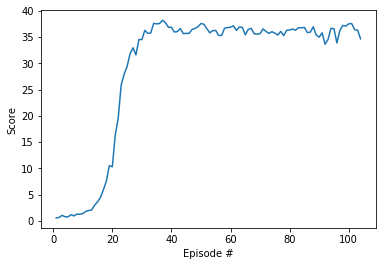

In [9]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(np.arange(1, len(scores)+1), scores)
plt.ylabel('Score')
plt.xlabel('Episode #')
plt.show()

Viola - it worked!  We can see that by the 26th episode (around 10 minutes of running on my MacBook Pro) the score is over 30 and the network remains stable thereafter.

In [10]:
# Watch the trained agent run

env_info = env.reset(train_mode=False)[brain_name] 
states = env_info.vector_observations
scores = np.zeros(num_agents)

for x in range(500):
    actions = agent.act(states, add_noise=False)
    env_info = env.step(actions)[brain_name]
    next_states = env_info.vector_observations
    rewards = env_info.rewards
    dones = env_info.local_done
    states = next_states
    scores += rewards
    if np.any(dones):
        break
        
env.close()

# Ideas for Future Work

If I had time, I would love to implement D4PG (discussed and referenced above).  I found a couple sample implementations of D4PG that would prove a good starting point.  

In addition to advantages of parallel processing, D4PG also leverages some of the other improvements to "rainbow" DQN described in a Deep Mind paper in 2017 (such as prioritized experience replay) would be obviously advantageous.  (_see_: https://arxiv.org/pdf/1710.02298.pdf)